<a href="https://colab.research.google.com/github/Vap5/Autonomous_vehicle_image_segmentation/blob/main/Autonomous_vehicle_image_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data Loading

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [3]:
from kaggle import api
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()

In [ ]:
!kaggle datasets list -s Self-Driving-Cars

ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
alincijov/self-driving-cars                                     Self-Driving Cars                                   892MB  2021-12-08 14:50:47           7824         82  0.7058824        
kumaresanmanickavelu/lyft-udacity-challenge                     Semantic Segmentation for Self Driving Cars           5GB  2018-05-18 05:59:42           8583        151  0.75             
pkdarabi/cardetection                                           Traffic Signs Detection                             100MB  2024-07-16 14:30:10           8119        134  1.0              
roydatascience/training-car                                 

In [4]:
!kaggle datasets download kumaresanmanickavelu/lyft-udacity-challenge

Dataset URL: https://www.kaggle.com/datasets/kumaresanmanickavelu/lyft-udacity-challenge
License(s): CC0-1.0
100% 5.11G/5.11G [04:03<00:00, 24.3MB/s]
100% 5.11G/5.11G [04:03<00:00, 22.5MB/s]


Data Structuring

In [5]:
import zipfile
z=zipfile.ZipFile('/content/lyft-udacity-challenge.zip','r')
z.extractall('/content/selfcars')
z.close()

In [6]:
import os
import shutil

def copy_folder_to_kaggle_working(source_folder, new_folder_name):
    # Define the destination path in kaggle/working
    destination_folder = os.path.join('/content/segmentation_data', new_folder_name)

    # Create the destination directory if it doesn't exist
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)
        print(f"Created new directory at: {destination_folder}")

    # Copy the entire folder structure to the destination
    try:
        shutil.copytree(source_folder, destination_folder, dirs_exist_ok=True)
        print(f"Successfully copied '{source_folder}' to '{destination_folder}'")
    except Exception as e:
        print(f"Error copying folder: {e}")

# source_folder = '/content/selfcars/dataE'
new_folder_name = 'segmentation_data'
l =['A','B','C','D','E']
for i in l:
  source_folder = f'/content/selfcars/data{i}'
  copy_folder_to_kaggle_working(source_folder, new_folder_name)



Created new directory at: /content/segmentation_data/segmentation_data
Successfully copied '/content/selfcars/dataA' to '/content/segmentation_data/segmentation_data'
Successfully copied '/content/selfcars/dataB' to '/content/segmentation_data/segmentation_data'
Successfully copied '/content/selfcars/dataC' to '/content/segmentation_data/segmentation_data'
Successfully copied '/content/selfcars/dataD' to '/content/segmentation_data/segmentation_data'
Successfully copied '/content/selfcars/dataE' to '/content/segmentation_data/segmentation_data'


In [1]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import numpy as np
import torch
import torch.nn.functional as F
from torch.optim import Adam
from tqdm import tqdm
from sklearn.metrics import jaccard_score, f1_score, recall_score, precision_score
import os
from tqdm import tqdm

class SegmentationDataset(Dataset):
    def __init__(self, base_dir, image_transform=None, mask_transform=None):
        self.base_dir = base_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.image_paths = []
        self.mask_paths = []

        # Collect paths for images in CameraRGB and corresponding masks in CameraSeg
        for data_folder in os.listdir(base_dir):
            rgb_dir = os.path.join(base_dir, data_folder, 'CameraRGB')
            seg_dir = os.path.join(base_dir, data_folder, 'CameraSeg')
            if os.path.isdir(rgb_dir) and os.path.isdir(seg_dir):
                for img_name in os.listdir(rgb_dir):
                    img_path = os.path.join(rgb_dir, img_name)
                    mask_path = os.path.join(seg_dir, img_name)
                    if os.path.exists(mask_path):  # Ensure the corresponding mask exists
                        self.image_paths.append(img_path)
                        self.mask_paths.append(mask_path)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load image and mask
        image = Image.open(self.image_paths[idx]).convert("RGB")
        mask = Image.open(self.mask_paths[idx])  # Assuming mask has integer class IDs

        # Apply transformations to image
        if self.image_transform:
            image = self.image_transform(image)

        # Apply transformations to mask and convert to tensor using torch.tensor
        if self.mask_transform:
            mask = self.mask_transform(mask)

        # Convert mask to numpy array
        mask = np.array(mask)  # Convert mask to numpy array

        # Convert mask to tensor using torch.tensor (if not already a tensor)
        mask = torch.tensor(mask, dtype=torch.long)  # Ensure it's a tensor of class IDs (int64)
        mask = mask.permute(2, 0,1)
        # print(f"Mask shape before argmax: {mask.ndim}")
        # if mask.ndim == 4:  # Check if masks have 4 dimensions: [Batch, Classes, Height, Width]
        #   mask = torch.argmax(mask, dim=1)
        #   print(f"Mask shape after argmax: {mask.shape}")
        # print('Masks unique:',torch.unique(mask))
        # If the mask is still single-channel (HxW), we don't need to squeeze as it's already (H, W)
        return image, mask

# class SegmentationDataset(Dataset):
#     def __init__(self, base_dir, image_transform=None, mask_transform=None):
#         self.base_dir = base_dir
#         self.image_transform = image_transform
#         self.mask_transform = mask_transform
#         self.image_paths = []
#         self.mask_paths = []

#         # Collect paths for images in CameraRGB and corresponding masks in CameraSeg
#         for data_folder in os.listdir(base_dir):
#             rgb_dir = os.path.join(base_dir, data_folder, 'CameraRGB')
#             seg_dir = os.path.join(base_dir, data_folder, 'CameraSeg')
#             if os.path.isdir(rgb_dir) and os.path.isdir(seg_dir):
#                 for img_name in os.listdir(rgb_dir):
#                     img_path = os.path.join(rgb_dir, img_name)
#                     mask_path = os.path.join(seg_dir, img_name)  # Assuming masks have the same filename
#                     if os.path.exists(mask_path):  # Ensure the corresponding mask exists
#                         self.image_paths.append(img_path)
#                         self.mask_paths.append(mask_path)

#     def __len__(self):
#         return len(self.image_paths)

#     def __getitem__(self, idx):
#         # Load image and mask
#         image = Image.open(self.image_paths[idx]).convert("RGB")
#         mask = Image.open(self.mask_paths[idx])  # Assuming mask has integer class IDs

#         # Apply transformations to image
#         if self.image_transform:
#             image = self.image_transform(image)

#         # Apply transformations to mask
#         if self.mask_transform:
#             mask = self.mask_transform(mask)

#         # Convert mask to numpy array and ensure it's a tensor
#         mask = np.array(mask, dtype=np.int64)  # Ensure mask is integer
#         mask = torch.tensor(mask, dtype=torch.long)  # Convert to tensor

#         # Debugging shape and values
#         print(f"Sample {idx} mask shape: {mask.shape}")
#         print(f"Sample {idx} unique values: {torch.unique(mask)}")

#         return image, mask


# Define separate transformations for images and masks
image_transform = transforms.Compose([
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
])

mask_transform = transforms.Compose([
    transforms.Resize((384, 384), interpolation=Image.NEAREST),
])

# Instantiate the dataset
base_dir = '/content/segmentation_data/segmentation_data'
dataset = SegmentationDataset(base_dir, image_transform=image_transform, mask_transform=mask_transform)

# Split dataset into training (80%), validation (10%), and testing (10%)
train_size = int(0.8 * len(dataset))
val_size = test_size = int(0.1 * len(dataset))
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Create DataLoaders for each split
batch_size = 4  # Define a batch size
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Example usage: print the shape of images and masks in a batch from the training loader
for i, m in train_loader:
    print(f"Image batch shape: {i.size()}")
    print(f"Images: {i}")
    print(f'Masks batch shape: {m.size()}')
    print(f'Masks_unique: {torch.unique(m)}')
    print(f'Mask_dim: {m.ndim}')
    print("Mask Data Type:", m.dtype)
    break


Image batch shape: torch.Size([4, 3, 384, 384])
Images: tensor([[[[0.5686, 0.5647, 0.5647,  ..., 0.6588, 0.6627, 0.6627],
          [0.5686, 0.5686, 0.5686,  ..., 0.6667, 0.6667, 0.6667],
          [0.5725, 0.5725, 0.5725,  ..., 0.6667, 0.6667, 0.6667],
          ...,
          [0.1647, 0.1529, 0.1529,  ..., 0.1451, 0.1451, 0.1490],
          [0.1490, 0.1451, 0.1373,  ..., 0.1490, 0.1451, 0.1529],
          [0.1451, 0.1373, 0.1333,  ..., 0.1569, 0.1608, 0.1569]],

         [[0.5216, 0.5176, 0.5216,  ..., 0.5843, 0.5843, 0.5843],
          [0.5216, 0.5216, 0.5216,  ..., 0.5922, 0.5922, 0.5922],
          [0.5255, 0.5255, 0.5255,  ..., 0.5922, 0.5922, 0.5922],
          ...,
          [0.1137, 0.1020, 0.1020,  ..., 0.0902, 0.0902, 0.0941],
          [0.0980, 0.0980, 0.0902,  ..., 0.0902, 0.0902, 0.0941],
          [0.0902, 0.0863, 0.0863,  ..., 0.0941, 0.0980, 0.0980]],

         [[0.4941, 0.4980, 0.4980,  ..., 0.4784, 0.4824, 0.4824],
          [0.4902, 0.4941, 0.4980,  ..., 0.4863, 0.4

In [ ]:
if m.ndim == 4:  # Shape: [Batch, Classes, Height, Width]
    print("Handling multi-channel masks without argmax...")
    print(f'Masks_unique_before_processing: {torch.unique(m)}')


    m = m[:,0,:,:]
    # Check shape after squeezing
    print(f"Shape after squeezing: {m.shape}")

    # Alternatively, if you need to ensure the mask has the correct dimensions,
    # you can use unsqueeze to add back the channel dimension:
    # m = m.unsqueeze(1)  # Now the shape is [Batch, 1, Height, Width] again.

    print(f'Masks_unique_after_processing: {torch.unique(m)}')


Handling multi-channel masks without argmax...
Masks_unique_before_processing: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
Shape after squeezing: torch.Size([16, 384, 384])
Masks_unique_after_processing: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])


Image check

In [ ]:
# Visualization
import matplotlib.pyplot as plt
def plot_test_images_with_masks(test_loader, num_images=8):
    """
    Plots a specified number of images and their corresponding masks side by side from the test_loader.

    Parameters:
    - test_loader: DataLoader containing test images and masks.
    - num_images: Total number of images to plot (default is 8).
    """
    images_accumulated = []
    masks_accumulated = []

    # Iterate through the test_loader to accumulate images and masks
    for images, masks in test_loader:
        images_accumulated.append(images)
        masks_accumulated.append(masks)

        # Stop once we have enough images
        if sum(batch.size(0) for batch in images_accumulated) >= num_images:
            break

    # Combine accumulated batches into a single tensor
    images = torch.cat(images_accumulated, dim=0)
    masks = torch.cat(masks_accumulated, dim=0)

    # Ensure we only take the required number of images
    images = images[:num_images]
    masks = masks[:num_images]


    print(f"Images shape: {images.shape}, Masks shape: {masks.shape}")
    print(f"Image value range: {images.min()} to {images.max()}")
    print(f"Mask unique values: {torch.unique(masks)}")

    plt.figure(figsize=(15, num_images * 3))

    for i in range(num_images):
        # Input Image
        plt.subplot(num_images, 2, 2 * i + 1)
        img = images[i].permute(1, 2, 0).cpu().numpy()  # Reorder dimensions to (H, W, C)
        img = np.clip(img, 0, 1)  # Clip values to [0, 1] for visualization
        plt.imshow(img)
        plt.title("Input Image")
        plt.axis("off")

        # Corresponding Mask
        plt.subplot(num_images, 2, 2 * i + 2)
        mask = masks[i].cpu().numpy()  # Convert mask to numpy array
        if mask.ndim == 3:
            mask = mask[0]  # If mask has multiple channels, take the first channel
        plt.imshow(mask, cmap="jet")
        plt.title("Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Images shape: torch.Size([50, 3, 384, 384]), Masks shape: torch.Size([50, 3, 384, 384])
Image value range: 0.0 to 1.0
Mask unique values: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])


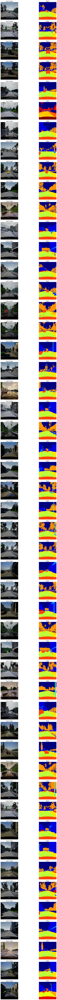

In [ ]:
plot_test_images_with_masks(test_loader, num_images=100)

Shape after squeezing: torch.Size([16, 384, 384])


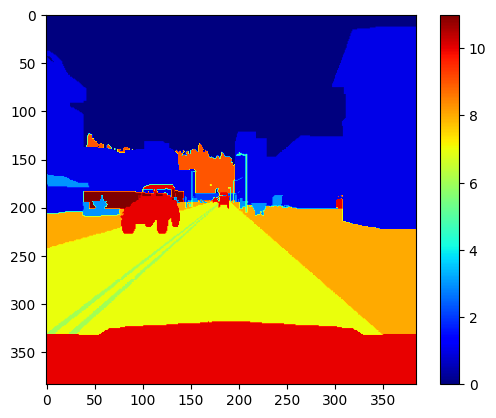

In [ ]:
import matplotlib.pyplot as plt
print(f"Shape after squeezing: {m.shape}")
plt.imshow(m[1].cpu().numpy(), cmap='jet')
plt.colorbar()
plt.show()

The below code loads a pre-trained SegFormer-B3 model from Hugging Face, fine-tuned on the ADE20K dataset for semantic segmentation. It first initializes a feature extractor (SegformerFeatureExtractor), which preprocesses images by resizing and normalizing them. Then, it loads the SegFormer model (SegformerForSemanticSegmentation) with output_hidden_states=True, enabling access to intermediate layer representations. This model predicts a segmentation mask, assigning a class label to each pixel, making it useful for tasks like scene understanding and object detection.

In [3]:
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

# Load the feature extractor and model with hidden states enabled
feature_extractor = SegformerFeatureExtractor.from_pretrained("nvidia/segformer-b3-finetuned-ade-512-512")
seg_model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b3-finetuned-ade-512-512", output_hidden_states=True
)

UNetDecoder class is a decoder module for a U-Net-like architecture, designed for semantic segmentation. It takes an input feature map (default 512 channels) and progressively upsamples it through four upsampling blocks (upconv_block), reducing the number of channels at each step (512 → 256 → 128 → 64 → 32). Each block consists of a transpose convolution (upsampling), batch normalization, and a ReLU activation. After the final upsampling block, the feature map is further resized to 384×384 using bilinear interpolation for a refined output. Finally, a 1×1 convolution maps the 32 channels to the desired number of segmentation classes (default 13), producing the final segmentation mask.

In [4]:

class UNetDecoder(nn.Module):
    def __init__(self, in_channels=512, out_channels=13):
        super(UNetDecoder, self).__init__()

        # First upsampling block
        self.up1 = self.upconv_block(in_channels, 256)
        # Second upsampling block
        self.up2 = self.upconv_block(256, 128)
        # Third upsampling block
        self.up3 = self.upconv_block(128, 64)
        # Fourth upsampling block (final resolution)
        self.up4 = self.upconv_block(64, 32)

        # Final 1x1 convolution to get the desired number of output channels (e.g., segmentation classes)
        self.final_conv = nn.Conv2d(32, out_channels, kernel_size=1)

    def upconv_block(self, in_channels, out_channels):
        """Upsample block with convolution and activation"""
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        # Pass through the decoder blocks
        x = self.up1(x)
        x = self.up2(x)
        x = self.up3(x)
        x = self.up4(x)
        # print('upsampling size:', x.shape)
        x = F.interpolate(x, size=(384, 384), mode='bilinear', align_corners=False)

        # Final output layer
        x = self.final_conv(x)
        return x  # Final output

# class UNetDecoder(nn.Module):
#     def __init__(self, num_classes, encoder_channels=13, dropout_prob=0.2):
#         super(UNetDecoder, self).__init__()

#         # First refine block with encoder channels, output 128 channels
#         self.refine1 = self.refine_block(encoder_channels, 128, dropout_prob)

#         # Second refine block, output 64 channels after concatenating the first skip connection
#         self.refine2 = self.refine_block(128 + encoder_channels, 64, dropout_prob)

#         # Third refine block, output 32 channels after concatenating the second skip connection
#         self.refine3 = self.refine_block(85, 64, dropout_prob)  # Corrected input channels
#         self.refine4 = self.refine_block(64, 32, dropout_prob)

#         # Final 1x1 convolution to output the segmentation map
#         self.final_conv = nn.Conv2d(32, num_classes, kernel_size=1)

#     def refine_block(self, in_channels, out_channels, dropout_prob):
#         """Refinement block with convolutions, activation, and dropout."""
#         return nn.Sequential(
#             nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
#             # nn.BatchNorm2d(out_channels),
#             nn.ReLU(),
#             # nn.Dropout(dropout_prob),
#             nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
#             # nn.BatchNorm2d(out_channels),
#             nn.ReLU()
#         )

#     def forward(self, x, encoder_features):
#         """
#         Forward pass for decoding with skip connections.

#         Args:
#         - x (Tensor): Input tensor from the encoder (usually the bottleneck).
#         - encoder_features (list): List of encoder features for skip connections.

#         Returns:
#         - Tensor: Output segmentation map.
#         """
#         # First refinement block with skip connection
#         x = self.refine1(x)
#         x = torch.cat([x, encoder_features[0]], dim=1)  # Concatenate with skip connection
#         # print(f"Shape after concatenation refine 1: {x.shape}")


#         # Second refinement block with skip connection
#         x = self.refine2(x)
#         x = torch.cat([x, encoder_features[1]], dim=1)  # Concatenate with skip connection
#         # print(f"Shape after concatenation refine 2: {x.shape}")

#         # Third refinement block with skip connection
#         x = self.refine3(x)  # Ensure correct number of channels after concatenation
#         # print(f"Shape after concatenation refine 3: {x.shape}")
#         x = self.refine4(x)  # New fourth block

#         # Final convolution to produce segmentation map
#         return self.final_conv(x)

In [10]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 931.6/931.6 kB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 27.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [5]:
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassF1Score, MulticlassPrecision, MulticlassRecall

Training and validation function: The train_segmentation_with_unet function trains a U-Net-based segmentation model by using a pre-trained segmentation model (seg_model) as the encoder just to extract image embeddings and a custom UNetDecoder as the decoder. It uses the Adam optimizer and cross-entropy loss for training while monitoring performance with IoU, F1-score, precision, and recall metrics. The function processes training and validation data through the encoder to extract feature embeddings, which are then passed through the decoder to generate segmentation maps. It implements early stopping when the F1-score reaches 0.9 and periodically saves the model at every 100 epochs. Training and validation losses, along with computed metrics, are logged and saved to specified file paths. If early stopping is not triggered, the final trained model is saved after completing all epochs. Error handling and CUDA memory management ensure robustness against runtime failures.

In [ ]:
def train_segmentation_with_unet(seg_model, train_loader, val_loader, num_classes, num_epochs, save_metrics_path, val_metrics_path):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # Initialize U-Net encoder and decoder
    encoder = seg_model.to(device)  # The segmentation model acts as the encoder
    decoder = UNetDecoder(in_channels=512, out_channels=13).to(device)  # Decoder with 13 input channels

    optimizer = torch.optim.Adam(decoder.parameters(), lr=0.0001)
    criterion = nn.CrossEntropyLoss()

    # Initialize metrics using torchmetrics
    iou_metric = MulticlassJaccardIndex(num_classes=num_classes).to(device)
    f1_metric = MulticlassF1Score(num_classes=num_classes).to(device)
    precision_metric = MulticlassPrecision(num_classes=num_classes).to(device)
    recall_metric = MulticlassRecall(num_classes=num_classes).to(device)

    train_metrics = []
    val_metrics = []

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch + 1}/{num_epochs}]")

        # Training Phase
        decoder.train()
        train_loss = 0
        iou_metric.reset()
        f1_metric.reset()
        precision_metric.reset()
        recall_metric.reset()

        for images, masks in tqdm(train_loader):
            images = images.to(device)
            masks = masks.to(device)

            try:
                # Handle multi-channel masks
                if masks.ndim == 4:  # Shape: [Batch, Classes, Height, Width]
                    masks = masks[:, 0, :, :]

                # Extract embeddings using the segmentation model
                inputs = feature_extractor(images=images, return_tensors="pt",do_rescale=False)
                inputs = {key: val.to(device) for key, val in inputs.items()}

                with torch.no_grad():
                  outputs = seg_model(**inputs)
                  embeddings = outputs.hidden_states[-1]  # Extract the last hidden state
                  embeddings = embeddings.permute(0, 1, 2,3)

                # Resize embeddings to match the target size
                # embeddings_resized = F.interpolate(embeddings, size=masks.shape[1:], mode='bilinear', align_corners=False)

                # Pass embeddings through the U-Net decoder to predict the segmentation map
                # print(f'Skip_connections: {skip_connections}')
                print('embeddings: ', embeddings.shape)
                outputs = decoder(embeddings)
                # outputs = F.interpolate(outputs, size=masks.shape[1:], mode='bilinear', align_corners=False)
                print(f"Output shape: {outputs.shape}")
                print(f"Mask shape: {masks.shape}")

                # Compute loss
                loss = criterion(outputs, masks)
                train_loss += loss.item()

                # Backpropagation
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Calculate metrics
                preds = outputs.argmax(dim=1)
                iou_metric.update(preds, masks)
                f1_metric.update(preds, masks)
                precision_metric.update(preds, masks)
                recall_metric.update(preds, masks)

            except Exception as e:
                print(f"Error occurred during training: {e}")
                torch.cuda.empty_cache()
                return

        train_loss /= len(train_loader)

        # Compute metrics
        train_iou = iou_metric.compute().item()
        train_f1 = f1_metric.compute().item()
        train_precision = precision_metric.compute().item()
        train_recall = recall_metric.compute().item()

        print(f"Training Loss: {train_loss:.4f}")
        print(f"Training Metrics - IoU: {train_iou:.4f}, F1 Score: {train_f1:.4f}, Precision: {train_precision:.4f}, Recall: {train_recall:.4f}")

        # Log training metrics
        train_metrics.append(f"Epoch {epoch + 1}: Train Loss={train_loss:.4f}, IoU={train_iou:.4f}, F1={train_f1:.4f}, Precision={train_precision:.4f}, Recall={train_recall:.4f}")

        # Early stopping based on F1 score
        if train_f1 >= 0.9:
            print(f"Early stopping triggered at epoch {epoch}. F1 Score reached {train_f1:.4f}.")
            torch.save({
                'epoch': epoch,
                'model_state_dict': decoder.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }, f"unet_decoder_epoch_{epoch}_early_stop.pth")
            print(f"Model saved as 'unet_decoder_epoch_{epoch}_early_stop.pth'.")
            break

        # Save the model at every 100th epoch
        if (epoch + 1) % 100 == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': decoder.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }, f"unet_decoder_epoch_{epoch}.pth")
            print(f"Model saved at epoch {epoch}.")

        # Validation Phase
        decoder.eval()
        val_loss = 0
        iou_metric.reset()
        f1_metric.reset()
        precision_metric.reset()
        recall_metric.reset()

        try:
            with torch.no_grad():
                for images, masks in tqdm(val_loader):
                    images = images.to(device)
                    masks = masks.to(device)

                    if masks.ndim == 4:
                        masks = masks[:, 0, :, :]

                    # Extract embeddings using the segmentation model
                    inputs = feature_extractor(images=images, return_tensors="pt",do_rescale=False)
                    inputs = {key: val.to(device) for key, val in inputs.items()}

                    with torch.no_grad():
                        outputs = seg_model(**inputs)
                        embeddings = outputs.hidden_states[-1]  # Extract the last hidden state
                        embeddings = embeddings.permute(0, 1, 2,3)

                    # embeddings_resized = F.interpolate(embeddings, size=masks.shape[1:], mode='bilinear', align_corners=False)
                    outputs = decoder(embeddings)


                    loss = criterion(outputs, masks)
                    val_loss += loss.item()

                    preds = outputs.argmax(dim=1)

                    # Update metrics on the fly
                    iou_metric.update(preds, masks)
                    f1_metric.update(preds, masks)
                    precision_metric.update(preds, masks)
                    recall_metric.update(preds, masks)

        except Exception as e:
            print(f"Error occurred during validation: {e}")
            torch.cuda.empty_cache()
            return

        val_loss /= len(val_loader)
        val_iou = iou_metric.compute().item()
        val_f1 = f1_metric.compute().item()
        val_precision = precision_metric.compute().item()
        val_recall = recall_metric.compute().item()

        print(f"Validation Loss: {val_loss:.4f}")
        print(f"Validation Metrics - IoU: {val_iou:.4f}, F1 Score: {val_f1:.4f}, Precision: {val_precision:.4f}, Recall: {val_recall:.4f}")

        val_metrics.append(f"Epoch {epoch + 1}: Validation Loss={val_loss:.4f}, IoU={val_iou:.4f}, F1={val_f1:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")

        # Reset metrics for the next epoch
        iou_metric.reset()
        f1_metric.reset()
        precision_metric.reset()
        recall_metric.reset()

    # Save the final model
    if train_f1 < 0.9:  # Only save as final if not stopped early
        torch.save({
            'epoch': num_epochs,
            'model_state_dict': decoder.state_dict(),
            'optimizer_state_dict': optimizer.state_dict()
        }, "final_unet_segmentation_model.pth")
        print("Final model saved as 'final_unet_segmentation_model.pth'.")

    # Save the training metrics to a file
    with open(save_metrics_path, "w") as f:
        f.writelines("\n".join(train_metrics))
    print(f"Training metrics saved to {save_metrics_path}")

    # Save the validation metrics to a file
    with open(val_metrics_path, "w") as f:
        f.writelines("\n".join(val_metrics))
    print(f"Validation metrics saved to {val_metrics_path}")


# def train_segmentation_with_unet(seg_model, train_loader, val_loader, num_classes, num_epochs, save_metrics_path, val_metrics_path):
#     device = 'cuda' if torch.cuda.is_available() else 'cpu'

#     # Initialize U-Net encoder and decoder
#     encoder = seg_model.to(device)  # The segmentation model acts as the encoder
#     decoder = UNetDecoder(num_classes=num_classes, encoder_channels=13).to(device)  # Decoder with 13 input channels

#     optimizer = torch.optim.Adam(decoder.parameters(), lr=0.0001)
#     criterion = nn.CrossEntropyLoss()  # Suitable for segmentation tasks

#     # Initialize metrics using torchmetrics
#     iou_metric = MulticlassJaccardIndex(num_classes=num_classes).to(device)
#     f1_metric = MulticlassF1Score(num_classes=num_classes).to(device)
#     precision_metric = MulticlassPrecision(num_classes=num_classes).to(device)
#     recall_metric = MulticlassRecall(num_classes=num_classes).to(device)

#     train_metrics = []
#     val_metrics = []

#     for epoch in range(num_epochs):
#         print(f"Epoch [{epoch + 1}/{num_epochs}]")

#         # Training Phase
#         decoder.train()
#         train_loss = 0
#         for images, masks in tqdm(train_loader):
#             images = images.to(device)
#             masks = masks.to(device)

#             try:
#                 # Handle multi-channel masks
#                 if masks.ndim == 4:  # Shape: [Batch, Classes, Height, Width]
#                     masks = masks[:, 0, :, :]

#                 # Extract embeddings using the segmentation model (encoder)
#                 with torch.no_grad():
#                     encoder_features = encoder(images)  # Encoder returns a dictionary or list of features
#                     # print(f"Encoder output shape: {encoder_features['out'].shape}")
#                     embeddings = encoder_features['out']  # Use the final output of the encoder
#                     skip_connections = [encoder_features[key] for key in encoder_features.keys()]  # Collect all skip connections

#                 # Resize embeddings to match the target size
#                 embeddings_resized = F.interpolate(embeddings, size=masks.shape[1:], mode='bilinear', align_corners=False)
#                 # print(f'embeddings_resized: {embeddings_resized.shape}')
#                 # print(f'Skip connections: {skip_connections}')
#                 # Pass embeddings through the U-Net decoder to predict the segmentation map
#                 outputs = decoder(embeddings_resized, skip_connections)  # Pass skip connections here
#                 outputs = F.interpolate(outputs, size=masks.shape[1:], mode='bilinear', align_corners=False)

#                 # Compute loss
#                 loss = criterion(outputs, masks)
#                 train_loss += loss.item()

#                 # Backpropagation
#                 optimizer.zero_grad()
#                 loss.backward()
#                 optimizer.step()

#             except Exception as e:
#                 print(f"Error occurred during training: {e}")
#                 torch.cuda.empty_cache()
#                 return

#         train_loss /= len(train_loader)
#         print(f"Training Loss: {train_loss:.4f}")
#         train_metrics.append(f"Epoch {epoch + 1}: Train Loss={train_loss:.4f}")

#         # Validation Phase
#         decoder.eval()
#         val_loss = 0
#         all_preds = []
#         all_masks = []

#         try:
#             with torch.no_grad():
#                 for images, masks in tqdm(val_loader):
#                     images = images.to(device)
#                     masks = masks.to(device)

#                     if masks.ndim == 4:
#                         masks = masks[:, 0, :, :]

#                     encoder_features = encoder(images)  # Encoder returns a dictionary or list of features
#                     embeddings = encoder_features['out']  # Use the final output of the encoder
#                     skip_connections = [encoder_features[key] for key in encoder_features.keys()]  # Collect all skip connections

#                     embeddings_resized = F.interpolate(embeddings, size=masks.shape[1:], mode='bilinear', align_corners=False)
#                     outputs = decoder(embeddings_resized, skip_connections)
#                     outputs = F.interpolate(outputs, size=masks.shape[1:], mode='bilinear', align_corners=False)

#                     loss = criterion(outputs, masks)
#                     val_loss += loss.item()

#                     preds = outputs.argmax(dim=1)

#                     # Update metrics on the fly
#                     iou_metric.update(preds, masks)
#                     f1_metric.update(preds, masks)
#                     precision_metric.update(preds, masks)
#                     recall_metric.update(preds, masks)

#         except Exception as e:
#             print(f"Error occurred during validation: {e}")
#             torch.cuda.empty_cache()
#             return

#         val_loss /= len(val_loader)
#         print(f"Validation Loss: {val_loss:.4f}")

#         # Compute final metrics
#         iou = iou_metric.compute().item()
#         f1 = f1_metric.compute().item()
#         recall = recall_metric.compute().item()
#         precision = precision_metric.compute().item()

#         print(f"IoU: {iou:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}")

#         # Save metrics for this epoch
#         train_metrics.append(f"Epoch {epoch + 1}: Validation Loss={val_loss:.4f}")
#         val_metrics.append(f"Epoch {epoch + 1}: IoU={iou:.4f}, F1={f1:.4f}, Recall={recall:.4f}, Precision={precision:.4f}")

#         # Early stopping condition
#         if f1 >= 0.90:
#             print(f"Early stopping as F1 score reached 90% at epoch {epoch + 1}")
#             break

#         # Reset metrics for the next epoch
#         iou_metric.reset()
#         f1_metric.reset()
#         precision_metric.reset()
#         recall_metric.reset()

#     # Save the final model
#     torch.save(decoder.state_dict(), "final_unet_segmentation_model.pth")
#     print("Final model saved as 'final_unet_segmentation_model.pth'.")

#     # Save the training metrics to a file
#     with open(save_metrics_path, "w") as f:
#         f.writelines("\n".join(train_metrics))
#     print(f"Training metrics saved to {save_metrics_path}")

#     # Save the validation metrics to a file
#     with open(val_metrics_path, "w") as f:
#         f.writelines("\n".join(val_metrics))
#     print(f"Validation metrics saved to {val_metrics_path}")

In [ ]:
train_segmentation_with_unet(
    seg_model=seg_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_classes=13,
    num_epochs=500,
    save_metrics_path="train_metrics.txt",
    val_metrics_path="validation_metrics.txt"
)

Epoch [1/500]


  0%|          | 1/1000 [00:00<04:11,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  0%|          | 2/1000 [00:00<04:03,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  0%|          | 3/1000 [00:00<04:03,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  0%|          | 4/1000 [00:00<04:05,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  0%|          | 5/1000 [00:01<04:05,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 6/1000 [00:01<04:06,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 7/1000 [00:01<04:04,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 8/1000 [00:01<04:06,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 9/1000 [00:02<04:05,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 10/1000 [00:02<04:05,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 11/1000 [00:02<04:03,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|          | 12/1000 [00:02<04:02,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|▏         | 13/1000 [00:03<04:02,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  1%|▏         | 14/1000 [00:03<04:03,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 15/1000 [00:03<04:04,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 16/1000 [00:03<04:03,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 17/1000 [00:04<04:03,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 18/1000 [00:04<04:02,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 19/1000 [00:04<04:01,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 20/1000 [00:04<04:00,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 21/1000 [00:05<03:59,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 22/1000 [00:05<03:59,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 23/1000 [00:05<04:00,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▏         | 24/1000 [00:05<03:57,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  2%|▎         | 25/1000 [00:06<03:58,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 26/1000 [00:06<03:58,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 27/1000 [00:06<03:58,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 28/1000 [00:06<03:56,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 29/1000 [00:07<03:56,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 30/1000 [00:07<03:57,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 31/1000 [00:07<03:58,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 32/1000 [00:07<04:00,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 33/1000 [00:08<03:59,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  3%|▎         | 34/1000 [00:08<04:02,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▎         | 35/1000 [00:08<04:00,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▎         | 36/1000 [00:08<04:01,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▎         | 37/1000 [00:09<04:02,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 38/1000 [00:09<04:00,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 39/1000 [00:09<04:01,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 40/1000 [00:09<03:59,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 41/1000 [00:10<03:58,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 42/1000 [00:10<03:57,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 43/1000 [00:10<03:57,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 44/1000 [00:10<03:55,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  4%|▍         | 45/1000 [00:11<03:55,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▍         | 46/1000 [00:11<03:54,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▍         | 47/1000 [00:11<03:55,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▍         | 48/1000 [00:11<03:55,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▍         | 49/1000 [00:12<03:54,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▌         | 50/1000 [00:12<03:54,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▌         | 51/1000 [00:12<03:54,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▌         | 52/1000 [00:12<03:52,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▌         | 53/1000 [00:13<03:51,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  5%|▌         | 54/1000 [00:13<03:51,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 55/1000 [00:13<03:53,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 56/1000 [00:13<03:52,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 57/1000 [00:14<03:51,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 58/1000 [00:14<03:51,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 59/1000 [00:14<03:50,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 60/1000 [00:14<03:50,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 61/1000 [00:15<03:50,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▌         | 62/1000 [00:15<03:50,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▋         | 63/1000 [00:15<03:50,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▋         | 64/1000 [00:15<03:49,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  6%|▋         | 65/1000 [00:16<03:47,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 66/1000 [00:16<03:48,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 67/1000 [00:16<03:50,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 68/1000 [00:16<03:47,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 69/1000 [00:17<03:46,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 70/1000 [00:17<03:45,  4.12it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 71/1000 [00:17<03:46,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 72/1000 [00:17<03:47,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 73/1000 [00:17<03:48,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  7%|▋         | 74/1000 [00:18<03:47,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 75/1000 [00:18<03:46,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 76/1000 [00:18<03:47,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 77/1000 [00:18<03:47,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 78/1000 [00:19<03:47,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 79/1000 [00:19<03:46,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 80/1000 [00:19<03:46,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 81/1000 [00:19<03:46,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 82/1000 [00:20<03:47,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 83/1000 [00:20<03:46,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 84/1000 [00:20<03:47,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  8%|▊         | 85/1000 [00:20<03:47,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▊         | 86/1000 [00:21<03:47,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▊         | 87/1000 [00:21<03:47,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 88/1000 [00:21<03:44,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 89/1000 [00:21<03:45,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 90/1000 [00:22<03:44,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 91/1000 [00:22<03:45,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 92/1000 [00:22<03:44,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 93/1000 [00:22<03:43,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


  9%|▉         | 94/1000 [00:23<03:44,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|▉         | 95/1000 [00:23<03:44,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|▉         | 96/1000 [00:23<03:44,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|▉         | 97/1000 [00:23<03:44,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|▉         | 98/1000 [00:24<03:43,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|▉         | 99/1000 [00:24<03:41,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|█         | 100/1000 [00:24<03:41,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|█         | 101/1000 [00:24<03:40,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|█         | 102/1000 [00:25<03:41,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|█         | 103/1000 [00:25<03:39,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|█         | 104/1000 [00:25<03:41,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 10%|█         | 105/1000 [00:25<03:40,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 106/1000 [00:26<03:41,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 107/1000 [00:26<03:40,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 108/1000 [00:26<03:38,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 109/1000 [00:26<03:40,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 110/1000 [00:27<03:38,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 111/1000 [00:27<03:38,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█         | 112/1000 [00:27<03:39,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█▏        | 113/1000 [00:27<03:38,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 11%|█▏        | 114/1000 [00:28<03:38,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 115/1000 [00:28<03:36,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 116/1000 [00:28<03:37,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 117/1000 [00:28<03:36,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 118/1000 [00:29<03:34,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 119/1000 [00:29<03:35,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 120/1000 [00:29<03:36,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 121/1000 [00:29<03:36,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 122/1000 [00:30<03:36,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 123/1000 [00:30<03:36,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▏        | 124/1000 [00:30<03:35,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 12%|█▎        | 125/1000 [00:30<03:35,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 126/1000 [00:31<03:36,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 127/1000 [00:31<03:36,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 128/1000 [00:31<03:38,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 129/1000 [00:31<03:38,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 130/1000 [00:32<03:38,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 131/1000 [00:32<03:39,  3.96it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 132/1000 [00:32<03:38,  3.97it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 133/1000 [00:32<03:38,  3.96it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 13%|█▎        | 134/1000 [00:33<03:37,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▎        | 135/1000 [00:33<03:37,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▎        | 136/1000 [00:33<03:37,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▎        | 137/1000 [00:33<03:36,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 138/1000 [00:34<03:34,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 139/1000 [00:34<03:39,  3.93it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 140/1000 [00:34<03:37,  3.96it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 141/1000 [00:34<03:34,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 142/1000 [00:35<03:33,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 143/1000 [00:35<03:34,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 144/1000 [00:35<03:34,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 14%|█▍        | 145/1000 [00:35<03:36,  3.94it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▍        | 146/1000 [00:36<03:34,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▍        | 147/1000 [00:36<03:34,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▍        | 148/1000 [00:36<03:34,  3.98it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▍        | 149/1000 [00:36<03:30,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▌        | 150/1000 [00:37<03:28,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▌        | 151/1000 [00:37<03:28,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▌        | 152/1000 [00:37<03:28,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▌        | 153/1000 [00:37<03:28,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 15%|█▌        | 154/1000 [00:38<03:27,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 155/1000 [00:38<03:27,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 156/1000 [00:38<03:25,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 157/1000 [00:38<03:28,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 158/1000 [00:39<03:27,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 159/1000 [00:39<03:26,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 160/1000 [00:39<03:25,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 161/1000 [00:39<03:25,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▌        | 162/1000 [00:40<03:25,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▋        | 163/1000 [00:40<03:25,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▋        | 164/1000 [00:40<03:26,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 16%|█▋        | 165/1000 [00:40<03:25,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 166/1000 [00:41<03:25,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 167/1000 [00:41<03:26,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 168/1000 [00:41<03:26,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 169/1000 [00:41<03:25,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 170/1000 [00:41<03:26,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 171/1000 [00:42<03:24,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 172/1000 [00:42<03:25,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 173/1000 [00:42<03:27,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 17%|█▋        | 174/1000 [00:42<03:26,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 175/1000 [00:43<03:25,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 176/1000 [00:43<03:24,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 177/1000 [00:43<03:24,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 178/1000 [00:43<03:24,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 179/1000 [00:44<03:25,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 180/1000 [00:44<03:23,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 181/1000 [00:44<03:21,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 182/1000 [00:44<03:22,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 183/1000 [00:45<03:21,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 184/1000 [00:45<03:20,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 18%|█▊        | 185/1000 [00:45<03:20,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▊        | 186/1000 [00:45<03:20,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▊        | 187/1000 [00:46<03:19,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 188/1000 [00:46<03:17,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 189/1000 [00:46<03:19,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 190/1000 [00:46<03:19,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 191/1000 [00:47<03:19,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 192/1000 [00:47<03:18,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 193/1000 [00:47<03:19,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 19%|█▉        | 194/1000 [00:47<03:19,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|█▉        | 195/1000 [00:48<03:19,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|█▉        | 196/1000 [00:48<03:18,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|█▉        | 197/1000 [00:48<03:19,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|█▉        | 198/1000 [00:48<03:19,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|█▉        | 199/1000 [00:49<03:18,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|██        | 200/1000 [00:49<03:17,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|██        | 201/1000 [00:49<03:18,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|██        | 202/1000 [00:49<03:18,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|██        | 203/1000 [00:50<03:17,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|██        | 204/1000 [00:50<03:14,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 20%|██        | 205/1000 [00:50<03:15,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 206/1000 [00:50<03:14,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 207/1000 [00:51<03:14,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 208/1000 [00:51<03:13,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 209/1000 [00:51<03:13,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 210/1000 [00:51<03:12,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 211/1000 [00:52<03:12,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██        | 212/1000 [00:52<03:12,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██▏       | 213/1000 [00:52<03:11,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 21%|██▏       | 214/1000 [00:52<03:10,  4.12it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 215/1000 [00:53<03:09,  4.13it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 216/1000 [00:53<03:10,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 217/1000 [00:53<03:11,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 218/1000 [00:53<03:11,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 219/1000 [00:54<03:13,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 220/1000 [00:54<03:13,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 221/1000 [00:54<03:13,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 222/1000 [00:54<03:13,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 223/1000 [00:55<03:13,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▏       | 224/1000 [00:55<03:12,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 22%|██▎       | 225/1000 [00:55<03:12,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 226/1000 [00:55<03:13,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 227/1000 [00:56<03:11,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 228/1000 [00:56<03:09,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 229/1000 [00:56<03:08,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 230/1000 [00:56<03:08,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 231/1000 [00:57<03:08,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 232/1000 [00:57<03:07,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 233/1000 [00:57<03:07,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 23%|██▎       | 234/1000 [00:57<03:06,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▎       | 235/1000 [00:58<03:06,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▎       | 236/1000 [00:58<03:05,  4.11it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▎       | 237/1000 [00:58<03:06,  4.10it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 238/1000 [00:58<03:06,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 239/1000 [00:58<03:06,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 240/1000 [00:59<03:06,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 241/1000 [00:59<03:06,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 242/1000 [00:59<03:05,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 243/1000 [00:59<03:07,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 244/1000 [01:00<03:05,  4.09it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 24%|██▍       | 245/1000 [01:00<03:06,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▍       | 246/1000 [01:00<03:05,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▍       | 247/1000 [01:00<03:05,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▍       | 248/1000 [01:01<03:04,  4.08it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▍       | 249/1000 [01:01<03:05,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▌       | 250/1000 [01:01<03:05,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▌       | 251/1000 [01:01<03:05,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▌       | 252/1000 [01:02<03:06,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▌       | 253/1000 [01:02<03:06,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 25%|██▌       | 254/1000 [01:02<03:05,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 255/1000 [01:02<03:06,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 256/1000 [01:03<03:04,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 257/1000 [01:03<03:04,  4.02it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 258/1000 [01:03<03:05,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 259/1000 [01:03<03:04,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 260/1000 [01:04<03:03,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 261/1000 [01:04<03:04,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▌       | 262/1000 [01:04<03:03,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▋       | 263/1000 [01:04<03:02,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▋       | 264/1000 [01:05<03:01,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 26%|██▋       | 265/1000 [01:05<03:01,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 266/1000 [01:05<03:02,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 267/1000 [01:05<03:02,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 268/1000 [01:06<03:03,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 269/1000 [01:06<03:02,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 270/1000 [01:06<03:04,  3.96it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 271/1000 [01:06<03:04,  3.95it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 272/1000 [01:07<03:04,  3.94it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 273/1000 [01:07<03:03,  3.95it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 27%|██▋       | 274/1000 [01:07<03:03,  3.95it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 275/1000 [01:07<03:01,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 276/1000 [01:08<03:02,  3.97it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 277/1000 [01:08<03:02,  3.97it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 278/1000 [01:08<03:02,  3.96it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 279/1000 [01:08<03:02,  3.95it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 280/1000 [01:09<03:01,  3.96it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 281/1000 [01:09<03:00,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 282/1000 [01:09<02:59,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 283/1000 [01:09<02:58,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 284/1000 [01:10<02:57,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 28%|██▊       | 285/1000 [01:10<02:56,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▊       | 286/1000 [01:10<02:57,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▊       | 287/1000 [01:10<02:56,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 288/1000 [01:11<02:55,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 289/1000 [01:11<02:54,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 290/1000 [01:11<02:54,  4.07it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 291/1000 [01:11<02:54,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 292/1000 [01:12<02:54,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 293/1000 [01:12<02:55,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 29%|██▉       | 294/1000 [01:12<02:55,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|██▉       | 295/1000 [01:12<02:55,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|██▉       | 296/1000 [01:13<02:55,  4.00it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|██▉       | 297/1000 [01:13<02:55,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|██▉       | 298/1000 [01:13<02:55,  3.99it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|██▉       | 299/1000 [01:13<02:54,  4.01it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|███       | 300/1000 [01:14<02:53,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|███       | 301/1000 [01:14<02:52,  4.06it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|███       | 302/1000 [01:14<02:53,  4.03it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|███       | 303/1000 [01:14<02:52,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|███       | 304/1000 [01:15<02:51,  4.05it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


 30%|███       | 305/1000 [01:15<02:51,  4.04it/s]

embeddings:  torch.Size([4, 512, 16, 16])
upsampling size: torch.Size([4, 32, 256, 256])
Output shape: torch.Size([4, 13, 384, 384])
Mask shape: torch.Size([4, 384, 384])


KeyboardInterrupt: 

Use below function if necessary to train further

In [ ]:
def train_segmentation_with_unet_from_checkpoint(
    seg_model,
    train_loader,
    val_loader,
    num_classes,
    num_epochs,
    save_metrics_path,
    val_metrics_path,
    checkpoint_path=None,
    start_epoch=None,
):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # Initialize U-Net encoder and decoder
    encoder = seg_model.to(device)  # The segmentation model acts as the encoder
    decoder = UNetDecoder(in_channels=512, out_channels=13).to(device)

    optimizer = torch.optim.Adam(decoder.parameters(), lr=0.0001)
    criterion = nn.CrossEntropyLoss()  # Suitable for segmentation tasks

    # Initialize metrics using torchmetrics
    iou_metric = MulticlassJaccardIndex(num_classes=num_classes).to(device)
    f1_metric = MulticlassF1Score(num_classes=num_classes).to(device)
    precision_metric = MulticlassPrecision(num_classes=num_classes).to(device)
    recall_metric = MulticlassRecall(num_classes=num_classes).to(device)

    # Load checkpoint if provided
    if checkpoint_path:
        checkpoint = torch.load(checkpoint_path, map_location=device) #, weights_only=False
        decoder.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        # Allow manual override of the starting epoch
        last_saved_epoch = checkpoint.get('epoch', 0) + 1
        start_epoch = start_epoch if start_epoch is not None else last_saved_epoch
        print(f"Checkpoint loaded. Resuming from epoch {start_epoch}.")
    else:
        # Start from epoch 1 if no checkpoint
        start_epoch = start_epoch or 1
        print(f"No checkpoint provided. Starting from epoch {start_epoch}.")

    train_metrics = []
    val_metrics = []

    for epoch in range(start_epoch, num_epochs + 1):
        print(f"Epoch [{epoch}/{num_epochs}]")

        # Training Phase
        decoder.train()
        train_loss = 0
        iou_metric.reset()
        f1_metric.reset()
        precision_metric.reset()
        recall_metric.reset()

        for images, masks in tqdm(train_loader):
            images = images.to(device)
            masks = masks.to(device)

            if masks.ndim == 4:  # Multi-channel masks
                masks = masks[:, 0, :, :]

            inputs = feature_extractor(images=images, return_tensors="pt",do_rescale=False)
            inputs = {key: val.to(device) for key, val in inputs.items()}

            with torch.no_grad():
              outputs = seg_model(**inputs)
              embeddings = outputs.hidden_states[-1]  # Extract the last hidden state
              embeddings = embeddings.permute(0, 1, 2,3)

            outputs = decoder(embeddings)


            loss = criterion(outputs, masks)
            train_loss += loss.item()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            preds = outputs.argmax(dim=1)
            iou_metric.update(preds, masks)
            f1_metric.update(preds, masks)
            precision_metric.update(preds, masks)
            recall_metric.update(preds, masks)

        train_loss /= len(train_loader)
        train_iou = iou_metric.compute().item()
        train_f1 = f1_metric.compute().item()
        train_precision = precision_metric.compute().item()
        train_recall = recall_metric.compute().item()

        print(f"Training Loss: {train_loss:.4f}, IoU: {train_iou:.4f}, F1 Score: {train_f1:.4f}, Precision: {train_precision:.4f}, Recall: {train_recall:.4f}")
        train_metrics.append(f"Epoch {epoch}: Train Loss={train_loss:.4f}, IoU={train_iou:.4f}, F1={train_f1:.4f}, Precision={train_precision:.4f}, Recall={train_recall:.4f}")

        if train_f1 >= 0.9:
            print(f"Early stopping triggered at epoch {epoch}. F1 Score reached {train_f1:.4f}.")
            torch.save({
                'epoch': epoch,
                'model_state_dict': decoder.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }, f"unet_decoder_epoch_{epoch}_early_stop.pth")
            print(f"Model saved as 'unet_decoder_epoch_{epoch}_early_stop.pth'.")
            break

        if epoch % 100 == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': decoder.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }, f"unet_decoder_epoch_{epoch}.pth")
            print(f"Model saved at epoch {epoch}.")

        # Validation Phase
        decoder.eval()
        val_loss = 0
        iou_metric.reset()
        f1_metric.reset()
        precision_metric.reset()
        recall_metric.reset()

        with torch.no_grad():
            for images, masks in tqdm(val_loader):
                images = images.to(device)
                masks = masks.to(device)

                if masks.ndim == 4:
                    masks = masks[:, 0, :, :]

                inputs = feature_extractor(images=images, return_tensors="pt",do_rescale=False)
                inputs = {key: val.to(device) for key, val in inputs.items()}

                with torch.no_grad():
                  outputs = seg_model(**inputs)
                  embeddings = outputs.hidden_states[-1]  # Extract the last hidden state
                  embeddings = embeddings.permute(0, 1, 2,3)

                outputs = decoder(embeddings)

                loss = criterion(outputs, masks)
                val_loss += loss.item()

                preds = outputs.argmax(dim=1)
                iou_metric.update(preds, masks)
                f1_metric.update(preds, masks)
                precision_metric.update(preds, masks)
                recall_metric.update(preds, masks)

        val_loss /= len(val_loader)
        val_iou = iou_metric.compute().item()
        val_f1 = f1_metric.compute().item()
        val_precision = precision_metric.compute().item()
        val_recall = recall_metric.compute().item()

        print(f"Validation Loss: {val_loss:.4f}, IoU: {val_iou:.4f}, F1 Score: {val_f1:.4f}, Precision: {val_precision:.4f}, Recall: {val_recall:.4f}")
        val_metrics.append(f"Epoch {epoch}: Validation Loss={val_loss:.4f}, IoU={val_iou:.4f}, F1={val_f1:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")

    # Save final model
    if train_f1 < 0.9:
        torch.save({
            'epoch': num_epochs,
            'model_state_dict': decoder.state_dict(),
            'optimizer_state_dict': optimizer.state_dict()
        }, "final_unet_segmentation_model.pth")
        print("Final model saved as 'final_unet_segmentation_model.pth'.")

    # Save metrics
    with open(save_metrics_path, "w") as f:
        f.writelines("\n".join(train_metrics))
    with open(val_metrics_path, "w") as f:
        f.writelines("\n".join(val_metrics))


In [ ]:
train_segmentation_with_unet_from_checkpoint(
    seg_model=seg_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_classes=13,
    num_epochs=700,
    save_metrics_path="train_metrics.txt",
    val_metrics_path="val_metrics.txt",
    checkpoint_path="/content/unet_decoder_epoch_99.pth",
    start_epoch=101  # Override starting epoch
)


<ipython-input-14-86a82515dd8d>:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device) #, weights_only=False


Checkpoint loaded. Resuming from epoch 101.
Epoch [101/700]


100%|██████████| 1000/1000 [04:28<00:00,  3.73it/s]


Training Loss: 0.1336, IoU: 0.6958, F1 Score: 0.7978, Precision: 0.8543, Recall: 0.7643


100%|██████████| 125/125 [00:32<00:00,  3.81it/s]


Validation Loss: 0.1290, IoU: 0.7060, F1 Score: 0.8066, Precision: 0.8668, Recall: 0.7716
Epoch [102/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1316, IoU: 0.6990, F1 Score: 0.8004, Precision: 0.8585, Recall: 0.7666


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1295, IoU: 0.7067, F1 Score: 0.8074, Precision: 0.8617, Recall: 0.7740
Epoch [103/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1309, IoU: 0.7008, F1 Score: 0.8020, Precision: 0.8584, Recall: 0.7685


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1308, IoU: 0.7008, F1 Score: 0.8019, Precision: 0.8617, Recall: 0.7677
Epoch [104/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1305, IoU: 0.7011, F1 Score: 0.8022, Precision: 0.8596, Recall: 0.7685


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1307, IoU: 0.7001, F1 Score: 0.8007, Precision: 0.8609, Recall: 0.7677
Epoch [105/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.79it/s]


Training Loss: 0.1301, IoU: 0.7019, F1 Score: 0.8029, Precision: 0.8604, Recall: 0.7692


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1315, IoU: 0.7002, F1 Score: 0.8018, Precision: 0.8577, Recall: 0.7668
Epoch [106/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1298, IoU: 0.7029, F1 Score: 0.8039, Precision: 0.8606, Recall: 0.7703


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1312, IoU: 0.6998, F1 Score: 0.8010, Precision: 0.8570, Recall: 0.7671
Epoch [107/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1295, IoU: 0.7042, F1 Score: 0.8051, Precision: 0.8605, Recall: 0.7717


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1318, IoU: 0.6984, F1 Score: 0.7998, Precision: 0.8546, Recall: 0.7661
Epoch [108/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1292, IoU: 0.7054, F1 Score: 0.8063, Precision: 0.8612, Recall: 0.7729


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1329, IoU: 0.6933, F1 Score: 0.7945, Precision: 0.8547, Recall: 0.7614
Epoch [109/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1289, IoU: 0.7054, F1 Score: 0.8062, Precision: 0.8617, Recall: 0.7727


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1326, IoU: 0.6950, F1 Score: 0.7961, Precision: 0.8517, Recall: 0.7642
Epoch [110/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1287, IoU: 0.7057, F1 Score: 0.8064, Precision: 0.8617, Recall: 0.7730


100%|██████████| 125/125 [00:32<00:00,  3.87it/s]


Validation Loss: 0.1331, IoU: 0.6928, F1 Score: 0.7940, Precision: 0.8569, Recall: 0.7585
Epoch [111/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1285, IoU: 0.7065, F1 Score: 0.8071, Precision: 0.8623, Recall: 0.7737


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1332, IoU: 0.6935, F1 Score: 0.7950, Precision: 0.8486, Recall: 0.7631
Epoch [112/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.79it/s]


Training Loss: 0.1282, IoU: 0.7065, F1 Score: 0.8071, Precision: 0.8626, Recall: 0.7737


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1332, IoU: 0.6939, F1 Score: 0.7952, Precision: 0.8490, Recall: 0.7633
Epoch [113/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1281, IoU: 0.7074, F1 Score: 0.8079, Precision: 0.8620, Recall: 0.7748


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1335, IoU: 0.6929, F1 Score: 0.7942, Precision: 0.8489, Recall: 0.7621
Epoch [114/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1280, IoU: 0.7075, F1 Score: 0.8080, Precision: 0.8628, Recall: 0.7747


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1334, IoU: 0.6908, F1 Score: 0.7918, Precision: 0.8468, Recall: 0.7600
Epoch [115/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1277, IoU: 0.7089, F1 Score: 0.8093, Precision: 0.8626, Recall: 0.7763


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1341, IoU: 0.6896, F1 Score: 0.7906, Precision: 0.8494, Recall: 0.7586
Epoch [116/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1276, IoU: 0.7086, F1 Score: 0.8090, Precision: 0.8637, Recall: 0.7757


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1341, IoU: 0.6904, F1 Score: 0.7913, Precision: 0.8474, Recall: 0.7599
Epoch [117/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1274, IoU: 0.7093, F1 Score: 0.8096, Precision: 0.8640, Recall: 0.7764


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1346, IoU: 0.6883, F1 Score: 0.7897, Precision: 0.8503, Recall: 0.7550
Epoch [118/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1272, IoU: 0.7099, F1 Score: 0.8101, Precision: 0.8635, Recall: 0.7771


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1351, IoU: 0.6889, F1 Score: 0.7906, Precision: 0.8492, Recall: 0.7567
Epoch [119/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1271, IoU: 0.7101, F1 Score: 0.8103, Precision: 0.8637, Recall: 0.7773


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1346, IoU: 0.6895, F1 Score: 0.7909, Precision: 0.8424, Recall: 0.7606
Epoch [120/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1270, IoU: 0.7098, F1 Score: 0.8100, Precision: 0.8647, Recall: 0.7768


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1353, IoU: 0.6897, F1 Score: 0.7914, Precision: 0.8439, Recall: 0.7605
Epoch [121/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1267, IoU: 0.7115, F1 Score: 0.8117, Precision: 0.8640, Recall: 0.7789


100%|██████████| 125/125 [00:32<00:00,  3.82it/s]


Validation Loss: 0.1352, IoU: 0.6854, F1 Score: 0.7860, Precision: 0.8460, Recall: 0.7553
Epoch [122/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1267, IoU: 0.7111, F1 Score: 0.8111, Precision: 0.8650, Recall: 0.7780


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1355, IoU: 0.6875, F1 Score: 0.7887, Precision: 0.8469, Recall: 0.7566
Epoch [123/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1266, IoU: 0.7113, F1 Score: 0.8114, Precision: 0.8645, Recall: 0.7785


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1354, IoU: 0.6864, F1 Score: 0.7875, Precision: 0.8452, Recall: 0.7561
Epoch [124/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1264, IoU: 0.7122, F1 Score: 0.8122, Precision: 0.8645, Recall: 0.7794


100%|██████████| 125/125 [00:32<00:00,  3.87it/s]


Validation Loss: 0.1354, IoU: 0.6858, F1 Score: 0.7864, Precision: 0.8448, Recall: 0.7555
Epoch [125/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1263, IoU: 0.7114, F1 Score: 0.8113, Precision: 0.8647, Recall: 0.7783


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1362, IoU: 0.6848, F1 Score: 0.7861, Precision: 0.8440, Recall: 0.7544
Epoch [126/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1262, IoU: 0.7122, F1 Score: 0.8122, Precision: 0.8647, Recall: 0.7794


100%|██████████| 125/125 [00:32<00:00,  3.83it/s]


Validation Loss: 0.1360, IoU: 0.6858, F1 Score: 0.7873, Precision: 0.8407, Recall: 0.7565
Epoch [127/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1261, IoU: 0.7126, F1 Score: 0.8125, Precision: 0.8645, Recall: 0.7798


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1358, IoU: 0.6862, F1 Score: 0.7871, Precision: 0.8440, Recall: 0.7569
Epoch [128/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1260, IoU: 0.7131, F1 Score: 0.8130, Precision: 0.8655, Recall: 0.7802


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1362, IoU: 0.6859, F1 Score: 0.7875, Precision: 0.8413, Recall: 0.7560
Epoch [129/700]


100%|██████████| 1000/1000 [04:23<00:00,  3.79it/s]


Training Loss: 0.1258, IoU: 0.7136, F1 Score: 0.8135, Precision: 0.8651, Recall: 0.7809


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1365, IoU: 0.6850, F1 Score: 0.7865, Precision: 0.8424, Recall: 0.7551
Epoch [130/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1256, IoU: 0.7140, F1 Score: 0.8138, Precision: 0.8660, Recall: 0.7810


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1371, IoU: 0.6832, F1 Score: 0.7847, Precision: 0.8366, Recall: 0.7555
Epoch [131/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1256, IoU: 0.7139, F1 Score: 0.8136, Precision: 0.8662, Recall: 0.7808


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1363, IoU: 0.6858, F1 Score: 0.7871, Precision: 0.8404, Recall: 0.7557
Epoch [132/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1255, IoU: 0.7142, F1 Score: 0.8139, Precision: 0.8656, Recall: 0.7813


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1363, IoU: 0.6841, F1 Score: 0.7851, Precision: 0.8425, Recall: 0.7542
Epoch [133/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1254, IoU: 0.7150, F1 Score: 0.8146, Precision: 0.8660, Recall: 0.7821


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1370, IoU: 0.6832, F1 Score: 0.7842, Precision: 0.8404, Recall: 0.7539
Epoch [134/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1253, IoU: 0.7149, F1 Score: 0.8146, Precision: 0.8667, Recall: 0.7819


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1368, IoU: 0.6854, F1 Score: 0.7866, Precision: 0.8383, Recall: 0.7567
Epoch [135/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1251, IoU: 0.7153, F1 Score: 0.8149, Precision: 0.8661, Recall: 0.7824


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1366, IoU: 0.6832, F1 Score: 0.7843, Precision: 0.8403, Recall: 0.7529
Epoch [136/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1251, IoU: 0.7151, F1 Score: 0.8147, Precision: 0.8671, Recall: 0.7820


100%|██████████| 125/125 [00:32<00:00,  3.83it/s]


Validation Loss: 0.1371, IoU: 0.6851, F1 Score: 0.7866, Precision: 0.8421, Recall: 0.7539
Epoch [137/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1250, IoU: 0.7159, F1 Score: 0.8154, Precision: 0.8663, Recall: 0.7830


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1369, IoU: 0.6840, F1 Score: 0.7851, Precision: 0.8378, Recall: 0.7558
Epoch [138/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1247, IoU: 0.7160, F1 Score: 0.8154, Precision: 0.8671, Recall: 0.7829


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1372, IoU: 0.6829, F1 Score: 0.7846, Precision: 0.8419, Recall: 0.7521
Epoch [139/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1248, IoU: 0.7158, F1 Score: 0.8152, Precision: 0.8669, Recall: 0.7827


100%|██████████| 125/125 [00:32<00:00,  3.84it/s]


Validation Loss: 0.1375, IoU: 0.6849, F1 Score: 0.7870, Precision: 0.8343, Recall: 0.7583
Epoch [140/700]


100%|██████████| 1000/1000 [04:25<00:00,  3.77it/s]


Training Loss: 0.1246, IoU: 0.7171, F1 Score: 0.8166, Precision: 0.8664, Recall: 0.7844


100%|██████████| 125/125 [00:32<00:00,  3.85it/s]


Validation Loss: 0.1375, IoU: 0.6820, F1 Score: 0.7831, Precision: 0.8381, Recall: 0.7519
Epoch [141/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.78it/s]


Training Loss: 0.1245, IoU: 0.7169, F1 Score: 0.8163, Precision: 0.8678, Recall: 0.7837


100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


Validation Loss: 0.1375, IoU: 0.6822, F1 Score: 0.7834, Precision: 0.8381, Recall: 0.7519
Epoch [142/700]


100%|██████████| 1000/1000 [04:24<00:00,  3.79it/s]


Training Loss: 0.1245, IoU: 0.7173, F1 Score: 0.8167, Precision: 0.8664, Recall: 0.7846


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1376, IoU: 0.6809, F1 Score: 0.7818, Precision: 0.8366, Recall: 0.7534
Epoch [143/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1244, IoU: 0.7165, F1 Score: 0.8158, Precision: 0.8680, Recall: 0.7832


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1379, IoU: 0.6839, F1 Score: 0.7854, Precision: 0.8337, Recall: 0.7566
Epoch [144/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1243, IoU: 0.7177, F1 Score: 0.8170, Precision: 0.8665, Recall: 0.7850


100%|██████████| 125/125 [00:30<00:00,  4.05it/s]


Validation Loss: 0.1378, IoU: 0.6819, F1 Score: 0.7830, Precision: 0.8349, Recall: 0.7541
Epoch [145/700]


100%|██████████| 1000/1000 [04:11<00:00,  3.98it/s]


Training Loss: 0.1241, IoU: 0.7179, F1 Score: 0.8171, Precision: 0.8678, Recall: 0.7848


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1379, IoU: 0.6820, F1 Score: 0.7830, Precision: 0.8372, Recall: 0.7524
Epoch [146/700]


100%|██████████| 1000/1000 [04:11<00:00,  3.98it/s]


Training Loss: 0.1242, IoU: 0.7180, F1 Score: 0.8173, Precision: 0.8675, Recall: 0.7850


100%|██████████| 125/125 [00:30<00:00,  4.04it/s]


Validation Loss: 0.1380, IoU: 0.6805, F1 Score: 0.7809, Precision: 0.8393, Recall: 0.7497
Epoch [147/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.98it/s]


Training Loss: 0.1240, IoU: 0.7179, F1 Score: 0.8171, Precision: 0.8675, Recall: 0.7849


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1384, IoU: 0.6804, F1 Score: 0.7816, Precision: 0.8374, Recall: 0.7499
Epoch [148/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1239, IoU: 0.7180, F1 Score: 0.8171, Precision: 0.8687, Recall: 0.7846


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1381, IoU: 0.6805, F1 Score: 0.7815, Precision: 0.8378, Recall: 0.7500
Epoch [149/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.98it/s]


Training Loss: 0.1239, IoU: 0.7185, F1 Score: 0.8176, Precision: 0.8679, Recall: 0.7854


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1382, IoU: 0.6835, F1 Score: 0.7850, Precision: 0.8364, Recall: 0.7556
Epoch [150/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1237, IoU: 0.7193, F1 Score: 0.8184, Precision: 0.8680, Recall: 0.7863


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1387, IoU: 0.6800, F1 Score: 0.7813, Precision: 0.8371, Recall: 0.7503
Epoch [151/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1238, IoU: 0.7190, F1 Score: 0.8180, Precision: 0.8683, Recall: 0.7859


100%|██████████| 125/125 [00:30<00:00,  4.12it/s]


Validation Loss: 0.1388, IoU: 0.6791, F1 Score: 0.7799, Precision: 0.8351, Recall: 0.7499
Epoch [152/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1236, IoU: 0.7196, F1 Score: 0.8187, Precision: 0.8682, Recall: 0.7866


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1387, IoU: 0.6808, F1 Score: 0.7819, Precision: 0.8385, Recall: 0.7512
Epoch [153/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1235, IoU: 0.7192, F1 Score: 0.8182, Precision: 0.8682, Recall: 0.7861


100%|██████████| 125/125 [00:30<00:00,  4.05it/s]


Validation Loss: 0.1386, IoU: 0.6820, F1 Score: 0.7831, Precision: 0.8352, Recall: 0.7531
Epoch [154/700]


100%|██████████| 1000/1000 [04:11<00:00,  3.98it/s]


Training Loss: 0.1234, IoU: 0.7194, F1 Score: 0.8183, Precision: 0.8685, Recall: 0.7862


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1386, IoU: 0.6811, F1 Score: 0.7825, Precision: 0.8365, Recall: 0.7505
Epoch [155/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1234, IoU: 0.7199, F1 Score: 0.8189, Precision: 0.8683, Recall: 0.7869


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1384, IoU: 0.6802, F1 Score: 0.7812, Precision: 0.8353, Recall: 0.7506
Epoch [156/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1234, IoU: 0.7201, F1 Score: 0.8190, Precision: 0.8686, Recall: 0.7870


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1386, IoU: 0.6830, F1 Score: 0.7842, Precision: 0.8310, Recall: 0.7572
Epoch [157/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1232, IoU: 0.7204, F1 Score: 0.8193, Precision: 0.8692, Recall: 0.7871


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1391, IoU: 0.6799, F1 Score: 0.7810, Precision: 0.8340, Recall: 0.7500
Epoch [158/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1232, IoU: 0.7210, F1 Score: 0.8200, Precision: 0.8689, Recall: 0.7881


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1395, IoU: 0.6789, F1 Score: 0.7800, Precision: 0.8354, Recall: 0.7488
Epoch [159/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1230, IoU: 0.7210, F1 Score: 0.8198, Precision: 0.8696, Recall: 0.7877


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1390, IoU: 0.6810, F1 Score: 0.7821, Precision: 0.8324, Recall: 0.7533
Epoch [160/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1230, IoU: 0.7204, F1 Score: 0.8192, Precision: 0.8690, Recall: 0.7872


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1389, IoU: 0.6812, F1 Score: 0.7823, Precision: 0.8307, Recall: 0.7539
Epoch [161/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1229, IoU: 0.7213, F1 Score: 0.8201, Precision: 0.8694, Recall: 0.7882


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1390, IoU: 0.6805, F1 Score: 0.7818, Precision: 0.8368, Recall: 0.7502
Epoch [162/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1229, IoU: 0.7216, F1 Score: 0.8203, Precision: 0.8689, Recall: 0.7886


100%|██████████| 125/125 [00:30<00:00,  4.11it/s]


Validation Loss: 0.1395, IoU: 0.6772, F1 Score: 0.7780, Precision: 0.8319, Recall: 0.7487
Epoch [163/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1229, IoU: 0.7210, F1 Score: 0.8198, Precision: 0.8692, Recall: 0.7879


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1397, IoU: 0.6793, F1 Score: 0.7803, Precision: 0.8314, Recall: 0.7513
Epoch [164/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1227, IoU: 0.7220, F1 Score: 0.8207, Precision: 0.8693, Recall: 0.7889


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1391, IoU: 0.6775, F1 Score: 0.7782, Precision: 0.8350, Recall: 0.7458
Epoch [165/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1226, IoU: 0.7217, F1 Score: 0.8204, Precision: 0.8693, Recall: 0.7885


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1396, IoU: 0.6790, F1 Score: 0.7798, Precision: 0.8315, Recall: 0.7506
Epoch [166/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1226, IoU: 0.7212, F1 Score: 0.8199, Precision: 0.8691, Recall: 0.7880


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1397, IoU: 0.6807, F1 Score: 0.7821, Precision: 0.8296, Recall: 0.7543
Epoch [167/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.00it/s]


Training Loss: 0.1225, IoU: 0.7217, F1 Score: 0.8204, Precision: 0.8696, Recall: 0.7884


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1392, IoU: 0.6796, F1 Score: 0.7801, Precision: 0.8316, Recall: 0.7516
Epoch [168/700]


100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


Training Loss: 0.1224, IoU: 0.7227, F1 Score: 0.8213, Precision: 0.8694, Recall: 0.7897


100%|██████████| 125/125 [00:30<00:00,  4.06it/s]


Validation Loss: 0.1397, IoU: 0.6773, F1 Score: 0.7785, Precision: 0.8329, Recall: 0.7477
Epoch [169/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1223, IoU: 0.7229, F1 Score: 0.8214, Precision: 0.8698, Recall: 0.7897


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1401, IoU: 0.6756, F1 Score: 0.7759, Precision: 0.8308, Recall: 0.7463
Epoch [170/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1224, IoU: 0.7219, F1 Score: 0.8205, Precision: 0.8699, Recall: 0.7885


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1400, IoU: 0.6780, F1 Score: 0.7789, Precision: 0.8320, Recall: 0.7485
Epoch [171/700]


100%|██████████| 1000/1000 [04:10<00:00,  4.00it/s]


Training Loss: 0.1223, IoU: 0.7229, F1 Score: 0.8215, Precision: 0.8698, Recall: 0.7898


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1395, IoU: 0.6798, F1 Score: 0.7809, Precision: 0.8312, Recall: 0.7522
Epoch [172/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.00it/s]


Training Loss: 0.1222, IoU: 0.7229, F1 Score: 0.8214, Precision: 0.8700, Recall: 0.7897


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1399, IoU: 0.6786, F1 Score: 0.7799, Precision: 0.8330, Recall: 0.7491
Epoch [173/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1222, IoU: 0.7236, F1 Score: 0.8220, Precision: 0.8703, Recall: 0.7904


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1400, IoU: 0.6788, F1 Score: 0.7805, Precision: 0.8333, Recall: 0.7487
Epoch [174/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1221, IoU: 0.7235, F1 Score: 0.8220, Precision: 0.8696, Recall: 0.7905


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1399, IoU: 0.6768, F1 Score: 0.7773, Precision: 0.8308, Recall: 0.7482
Epoch [175/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1220, IoU: 0.7234, F1 Score: 0.8219, Precision: 0.8705, Recall: 0.7901


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1403, IoU: 0.6793, F1 Score: 0.7804, Precision: 0.8293, Recall: 0.7532
Epoch [176/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1220, IoU: 0.7235, F1 Score: 0.8219, Precision: 0.8698, Recall: 0.7904


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1400, IoU: 0.6789, F1 Score: 0.7797, Precision: 0.8323, Recall: 0.7502
Epoch [177/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1219, IoU: 0.7236, F1 Score: 0.8220, Precision: 0.8706, Recall: 0.7903


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1404, IoU: 0.6780, F1 Score: 0.7793, Precision: 0.8317, Recall: 0.7490
Epoch [178/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.02it/s]


Training Loss: 0.1218, IoU: 0.7236, F1 Score: 0.8219, Precision: 0.8702, Recall: 0.7903


100%|██████████| 125/125 [00:30<00:00,  4.07it/s]


Validation Loss: 0.1408, IoU: 0.6763, F1 Score: 0.7771, Precision: 0.8299, Recall: 0.7478
Epoch [179/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1218, IoU: 0.7244, F1 Score: 0.8227, Precision: 0.8704, Recall: 0.7913


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1404, IoU: 0.6769, F1 Score: 0.7781, Precision: 0.8300, Recall: 0.7477
Epoch [180/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1218, IoU: 0.7237, F1 Score: 0.8221, Precision: 0.8704, Recall: 0.7905


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1402, IoU: 0.6802, F1 Score: 0.7815, Precision: 0.8272, Recall: 0.7544
Epoch [181/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1217, IoU: 0.7247, F1 Score: 0.8231, Precision: 0.8705, Recall: 0.7916


100%|██████████| 125/125 [00:30<00:00,  4.12it/s]


Validation Loss: 0.1404, IoU: 0.6780, F1 Score: 0.7793, Precision: 0.8304, Recall: 0.7501
Epoch [182/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1217, IoU: 0.7243, F1 Score: 0.8226, Precision: 0.8708, Recall: 0.7911


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1406, IoU: 0.6759, F1 Score: 0.7771, Precision: 0.8293, Recall: 0.7472
Epoch [183/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1215, IoU: 0.7247, F1 Score: 0.8230, Precision: 0.8710, Recall: 0.7915


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1407, IoU: 0.6786, F1 Score: 0.7799, Precision: 0.8264, Recall: 0.7507
Epoch [184/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.00it/s]


Training Loss: 0.1215, IoU: 0.7249, F1 Score: 0.8231, Precision: 0.8702, Recall: 0.7919


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1405, IoU: 0.6783, F1 Score: 0.7794, Precision: 0.8302, Recall: 0.7501
Epoch [185/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1215, IoU: 0.7246, F1 Score: 0.8229, Precision: 0.8710, Recall: 0.7913


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1404, IoU: 0.6790, F1 Score: 0.7803, Precision: 0.8278, Recall: 0.7518
Epoch [186/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1215, IoU: 0.7251, F1 Score: 0.8234, Precision: 0.8711, Recall: 0.7918


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1407, IoU: 0.6781, F1 Score: 0.7791, Precision: 0.8274, Recall: 0.7520
Epoch [187/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1214, IoU: 0.7252, F1 Score: 0.8234, Precision: 0.8709, Recall: 0.7920


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1405, IoU: 0.6783, F1 Score: 0.7793, Precision: 0.8296, Recall: 0.7501
Epoch [188/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.02it/s]


Training Loss: 0.1213, IoU: 0.7257, F1 Score: 0.8239, Precision: 0.8718, Recall: 0.7924


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1406, IoU: 0.6783, F1 Score: 0.7790, Precision: 0.8297, Recall: 0.7495
Epoch [189/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.02it/s]


Training Loss: 0.1212, IoU: 0.7258, F1 Score: 0.8239, Precision: 0.8709, Recall: 0.7927


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1407, IoU: 0.6772, F1 Score: 0.7780, Precision: 0.8293, Recall: 0.7489
Epoch [190/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.00it/s]


Training Loss: 0.1212, IoU: 0.7254, F1 Score: 0.8236, Precision: 0.8707, Recall: 0.7923


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1409, IoU: 0.6767, F1 Score: 0.7778, Precision: 0.8333, Recall: 0.7464
Epoch [191/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1212, IoU: 0.7255, F1 Score: 0.8236, Precision: 0.8709, Recall: 0.7923


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1409, IoU: 0.6767, F1 Score: 0.7774, Precision: 0.8285, Recall: 0.7488
Epoch [192/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.01it/s]


Training Loss: 0.1212, IoU: 0.7258, F1 Score: 0.8239, Precision: 0.8718, Recall: 0.7923


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1410, IoU: 0.6761, F1 Score: 0.7770, Precision: 0.8294, Recall: 0.7470
Epoch [193/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.02it/s]


Training Loss: 0.1210, IoU: 0.7265, F1 Score: 0.8246, Precision: 0.8712, Recall: 0.7934


100%|██████████| 125/125 [00:30<00:00,  4.11it/s]


Validation Loss: 0.1411, IoU: 0.6768, F1 Score: 0.7773, Precision: 0.8251, Recall: 0.7499
Epoch [194/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1210, IoU: 0.7266, F1 Score: 0.8246, Precision: 0.8716, Recall: 0.7933


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1411, IoU: 0.6762, F1 Score: 0.7769, Precision: 0.8293, Recall: 0.7475
Epoch [195/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.00it/s]


Training Loss: 0.1210, IoU: 0.7264, F1 Score: 0.8243, Precision: 0.8722, Recall: 0.7929


100%|██████████| 125/125 [00:30<00:00,  4.10it/s]


Validation Loss: 0.1412, IoU: 0.6783, F1 Score: 0.7795, Precision: 0.8268, Recall: 0.7509
Epoch [196/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1209, IoU: 0.7263, F1 Score: 0.8242, Precision: 0.8710, Recall: 0.7931


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1416, IoU: 0.6761, F1 Score: 0.7771, Precision: 0.8284, Recall: 0.7483
Epoch [197/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1208, IoU: 0.7270, F1 Score: 0.8250, Precision: 0.8713, Recall: 0.7939


100%|██████████| 125/125 [00:30<00:00,  4.11it/s]


Validation Loss: 0.1412, IoU: 0.6769, F1 Score: 0.7779, Precision: 0.8274, Recall: 0.7498
Epoch [198/700]


100%|██████████| 1000/1000 [04:09<00:00,  4.00it/s]


Training Loss: 0.1208, IoU: 0.7269, F1 Score: 0.8248, Precision: 0.8714, Recall: 0.7938


100%|██████████| 125/125 [00:30<00:00,  4.08it/s]


Validation Loss: 0.1415, IoU: 0.6755, F1 Score: 0.7767, Precision: 0.8295, Recall: 0.7459
Epoch [199/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1208, IoU: 0.7275, F1 Score: 0.8254, Precision: 0.8712, Recall: 0.7945


100%|██████████| 125/125 [00:30<00:00,  4.09it/s]


Validation Loss: 0.1410, IoU: 0.6758, F1 Score: 0.7768, Precision: 0.8317, Recall: 0.7454
Epoch [200/700]


100%|██████████| 1000/1000 [04:08<00:00,  4.02it/s]


Training Loss: 0.1207, IoU: 0.7274, F1 Score: 0.8253, Precision: 0.8717, Recall: 0.7942
Model saved at epoch 200.


100%|██████████| 125/125 [00:30<00:00,  4.11it/s]


Validation Loss: 0.1414, IoU: 0.6754, F1 Score: 0.7760, Precision: 0.8287, Recall: 0.7467
Epoch [201/700]


  4%|▎         | 37/1000 [00:09<04:02,  3.96it/s]


KeyboardInterrupt: 

In [ ]:
del seg_model

In [ ]:
torch.cuda.empty_cache()



The test_segmentation_model function evaluates a segmentation model by loading a pre-trained decoder, computing loss and performance metrics (IoU, F1 Score, Precision, and Recall) using torchmetrics, and visualizing predictions. It processes images through a feature extractor, passes them through the model and decoder, and computes cross-entropy loss. Predictions are compared against ground truth masks, and accumulated results are used to compute overall performance. The function also saves metrics to a file and visualizes a few sample images along with their corresponding ground truth and predicted segmentation masks, ensuring proper visualization by clipping image values.


In [9]:
import matplotlib.pyplot as plt

def test_segmentation_model(seg_model, decoder_checkpoint_path, test_loader, num_classes, test_metrics_path, num_samples=10):
    device = 'cuda'  # Ensure model runs on GPU

    # Load decoder model
    decoder = UNetDecoder(in_channels=512, out_channels=num_classes).to(device)
    checkpoint = torch.load(decoder_checkpoint_path, map_location=device)
    decoder.load_state_dict(checkpoint['model_state_dict'])
    decoder.to(device)
    seg_model = seg_model.to(device)

    # Set models to evaluation mode
    seg_model.eval()
    decoder.eval()

    # Initialize metrics using torchmetrics
    iou_metric = MulticlassJaccardIndex(num_classes=num_classes).to(device)
    f1_metric = MulticlassF1Score(num_classes=num_classes).to(device)
    precision_metric = MulticlassPrecision(num_classes=num_classes).to(device)
    recall_metric = MulticlassRecall(num_classes=num_classes).to(device)

    test_loss = 0
    criterion = nn.CrossEntropyLoss()

    all_preds = []
    all_masks = []
    all_images = []  # Store images to maintain order

    with torch.no_grad():
        for idx, (images, masks) in enumerate(test_loader):
            images = images.to(device)
            masks = masks.to(device)

            if masks.ndim == 4:
                masks = masks[:, 0, :, :]  # Ensure masks have correct dimensions

            # Store images before processing for correct alignment
            all_images.append(images.cpu())

            # Feature extraction
            inputs = feature_extractor(images=images, return_tensors="pt", do_rescale=False)
            inputs = {key: val.to(device) for key, val in inputs.items()}

            # Get embeddings from SegFormer model
            outputs = seg_model(**inputs)
            embeddings = outputs.hidden_states[-1]  # Extract last hidden state
            embeddings = embeddings.permute(0, 1, 2, 3)

            # Decoder prediction
            outputs = decoder(embeddings)

            # Compute loss
            loss = criterion(outputs, masks)
            test_loss += loss.item()

            preds = outputs.argmax(dim=1)  # Get predicted class labels
            all_preds.append(preds.cpu())
            all_masks.append(masks.cpu())

            # Update metrics
            iou_metric.update(preds, masks)
            f1_metric.update(preds, masks)
            precision_metric.update(preds, masks)
            recall_metric.update(preds, masks)

    # Compute final metrics
    iou = iou_metric.compute().item()
    f1 = f1_metric.compute().item()
    recall = recall_metric.compute().item()
    precision = precision_metric.compute().item()

    # Reset metrics for future runs
    iou_metric.reset()
    f1_metric.reset()
    precision_metric.reset()
    recall_metric.reset()

    test_loss /= len(test_loader)

    # Save metrics to file
    with open(test_metrics_path, "w") as f:
        f.write(f"Test Loss: {test_loss:.4f}\n")
        f.write(f"IoU: {iou:.4f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}\n")
    print(f"Test metrics saved to {test_metrics_path}")

    # Visualization
    print("Generating visualizations for sample predictions...")
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        if i >= len(all_preds):
            break

        # Get stored input image
        image_tensor = all_images[i][0]  # Correct image from stored list
        image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C)
        image_np = np.clip(image_np, 0, 1)  # Normalize for visualization

        # Get ground truth mask and predicted segmentation
        pred = all_preds[i][0].squeeze().numpy()  # Shape: (H, W)
        mask = all_masks[i][0].squeeze().numpy()  # Shape: (H, W)

        # Plot input image
        axes[i, 0].imshow(image_np)
        axes[i, 0].set_title("Input Image")
        axes[i, 0].axis("off")

        # Plot ground truth mask
        axes[i, 1].imshow(mask, cmap="jet")
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Plot predicted segmentation
        axes[i, 2].imshow(pred, cmap="jet")
        axes[i, 2].set_title("Predicted Segmentation")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()


<ipython-input-9-a21be0d05e81>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(decoder_checkpoint_path, map_location=device)


Test metrics saved to test_metrics.txt
Generating visualizations for sample predictions...


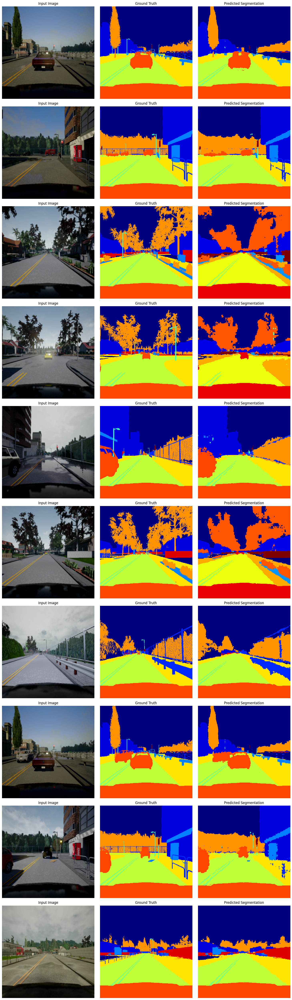

In [11]:
test_segmentation_model(
    seg_model=seg_model,
    decoder_checkpoint_path="/content/unet_decoder.pth",
    test_loader=test_loader,
    num_classes=13,
    test_metrics_path="test_metrics.txt",
    num_samples=10
)